<a href="https://colab.research.google.com/github/ujjainidas/spotlight/blob/main/Crosswalk.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

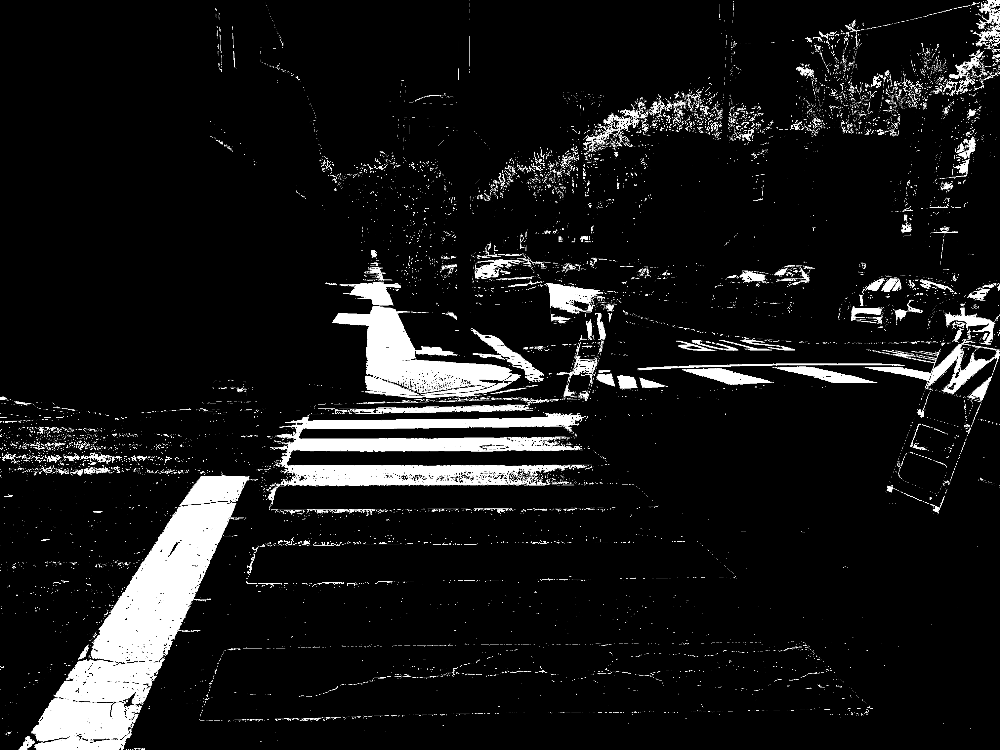

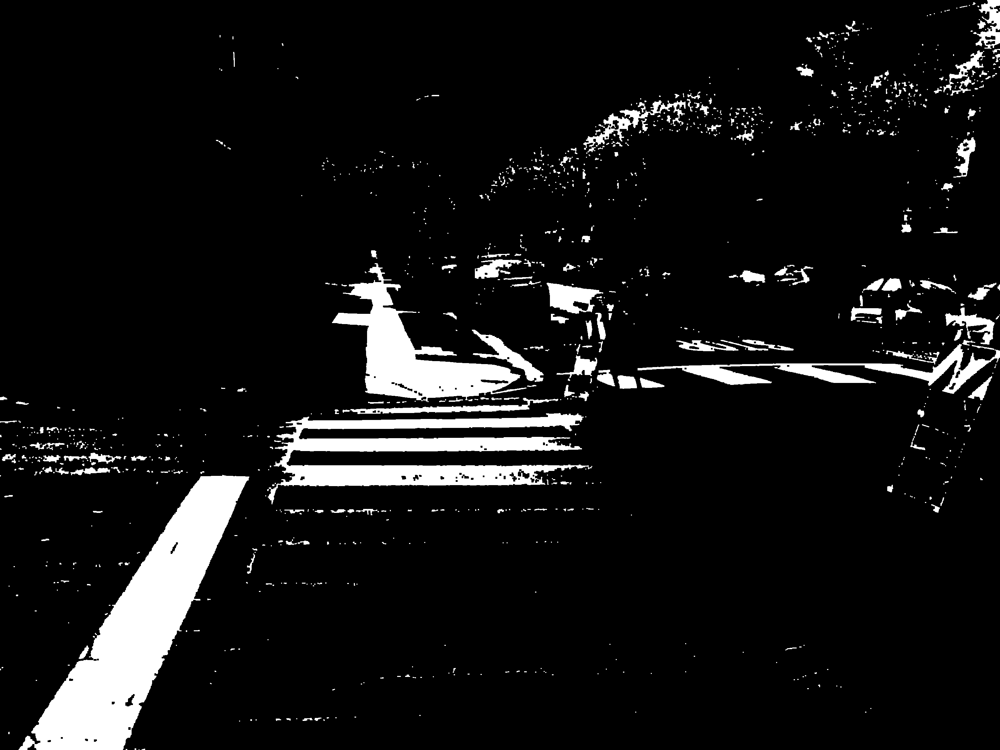

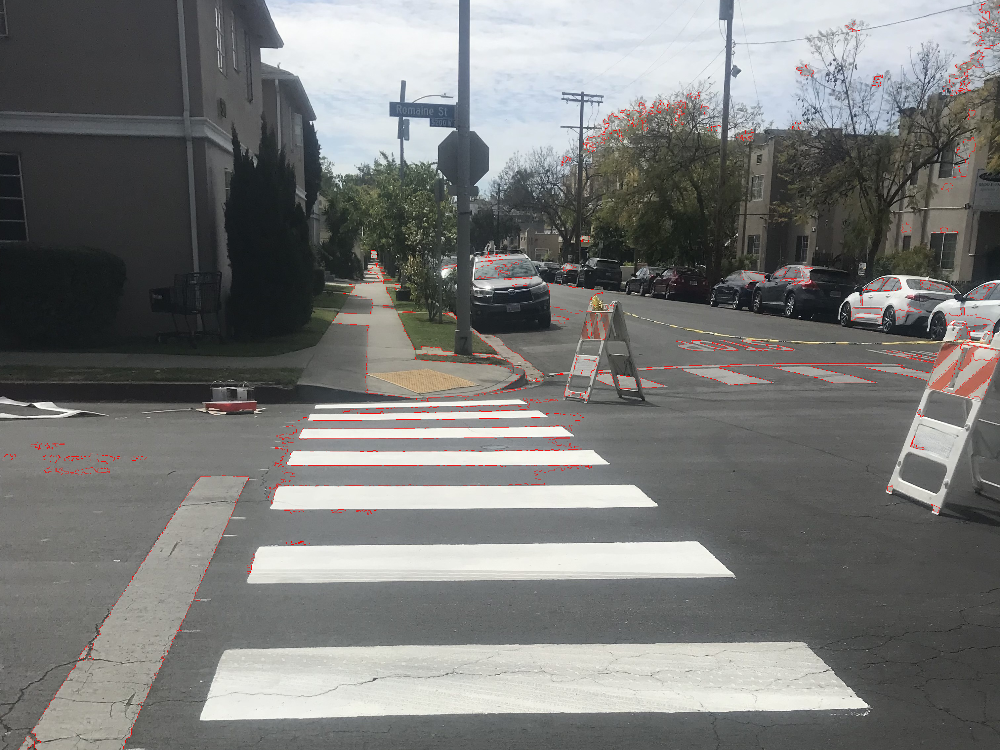

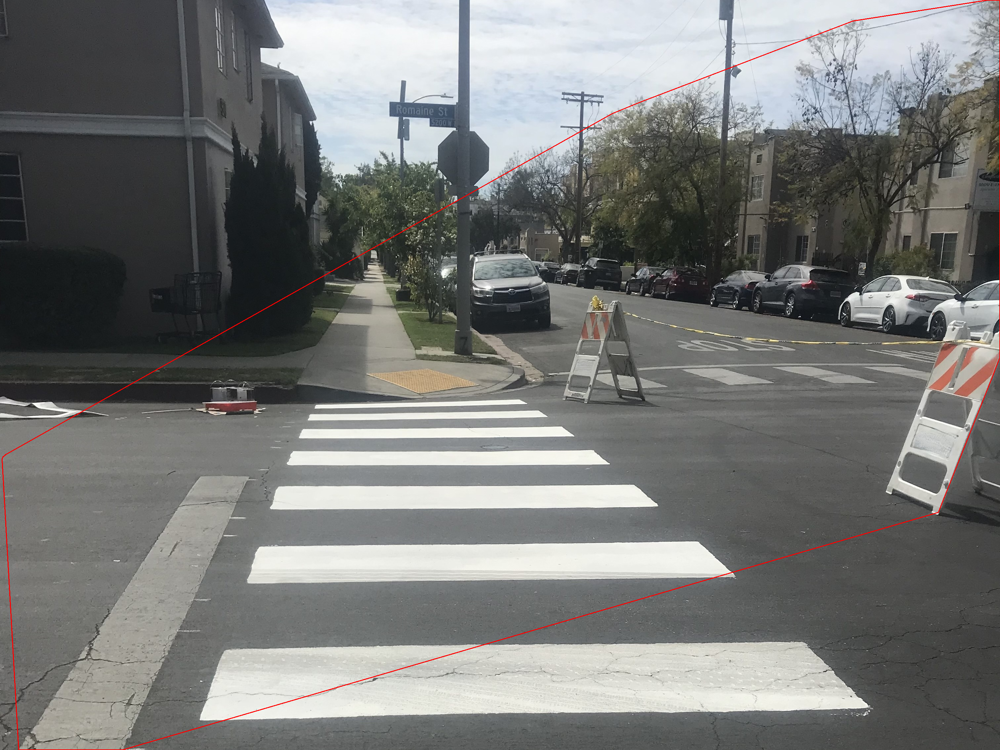

-1

In [6]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# read image
img = cv2.imread('walkway2.jpg')

#cropped_image = img[80:280, 150:330]
 
# Display the cropped image
#cv2_imshow(cropped_image)

# threshold on white/gray sidewalk stripes
lower = (100,130,130)
upper = (180,200,200)
thresh = cv2.inRange(img, lower, upper)


# apply morphology close to fill interior regions in mask
kernel = np.ones((3,3), np.uint8)
morph = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)
kernel = np.ones((5,5), np.uint8)
morph = cv2.morphologyEx(morph, cv2.MORPH_CLOSE, kernel)

# get contours
cntrs = cv2.findContours(morph, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cntrs = cntrs[0] if len(cntrs) == 2 else cntrs[1]

# filter on area
contours = img.copy()
good_contours = []
for c in cntrs:
    area = cv2.contourArea(c)
    if area > 200:
        cv2.drawContours(contours, [c], -1, (0,0,255), 1)
        good_contours.append(c)

# combine good contours
contours_combined = np.vstack(good_contours)

# get convex hull
result = img.copy()
hull = cv2.convexHull(contours_combined)
cv2.polylines(result, [hull], True, (0,0,255), 2)

# write result to disk
cv2.imwrite("walkway_thresh.jpg", thresh)
cv2.imwrite("walkway_morph.jpg", morph)
cv2.imwrite("walkway_contours.jpg", contours)
cv2.imwrite("walkway_result.jpg", result)

# display it
cv2_imshow(thresh)
cv2_imshow(morph)
cv2_imshow(contours)
cv2_imshow(result)
cv2.waitKey(0)